# Introduction

# Import the Libraries

In [16]:
# import the necessary packages

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import matplotlib as matplt
import matplotlib.gridspec as gridspec
import seaborn as sns
%matplotlib inline
import random
from shutil import copyfile
from pathlib import Path
import glob


from xml.etree import ElementTree
from xml.dom import minidom
import collections


# ML Utilities
from sklearn.model_selection import train_test_split
#import imutils
#from imutils import paths

# Image preprocessing Libraries
from skimage import io
from skimage.transform import resize,rescale
from skimage import exposure
from skimage.filters import gaussian
from sklearn.preprocessing import LabelBinarizer

# CV Libraries
import mimetypes
import argparse
import pickle
#import cv2


# DL Libraries
import tensorflow as tf

from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dropout, Dense, Input, GRU, LSTM, TimeDistributed, BatchNormalization, Activation, GlobalAveragePooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical
from keras.layers.convolutional import Conv3D, MaxPooling3D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras import optimizers,regularizers
from tensorflow.keras.regularizers import l1,l2,l1_l2





In [17]:
#Change the working directory
%cd C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\MSc\Road_Damage_Detection\Data\IEEE_Data\train

C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\MSc\Road_Damage_Detection\Data\IEEE_Data\train


# Import the Images

In [18]:
base_path = r"C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\MSc\Road_Damage_Detection\Data\IEEE_Data\train"

# Damage Types
damageTypes=["D00", "D01", "D10", "D11", "D20", "D40", "D43", "D44"]

# Country List
cntry_list = ["Czech","Japan","India"] 

In [4]:
# the number of total images and total labels.
cls_names = []
total_images = 0
for cntry in cntry_list:
    
    file_list = [filename for filename in os.listdir(base_path + "/" + cntry + '\Annotations') if not filename.startswith('.')]

    for file in file_list:
        
        if file =='.DS_Store':
            pass
        else:
            path = base_path + "/" + cntry + '\Annotations' +  "/" + file
            xml_li = os.listdir(path)
            
            for infile_xml in xml_li:
                
                total_images = total_images + 1
                tree = ElementTree.parse(path+"/"+infile_xml)
                root = tree.getroot()
                for obj in root.iter('object'):
                    cls_name = obj.find('name').text
                    cls_names.append(cls_name)
                    
print("total")
print("Total Number of images：" + str(total_images))
print("Total Number of labels：" + str(len(cls_names)))

total
Total Number of images：21041
Total Number of labels：34702


D00 : 6592
D01 : 179
D10 : 4446
D11 : 45
D20 : 8381
D40 : 5627
D43 : 793
D44 : 5057


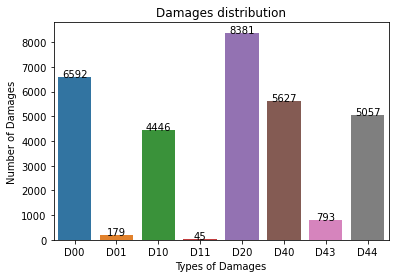

In [5]:
# Count the number of class labels
import collections

count_dict = collections.Counter(cls_names)
cls_count = []

for damageType in damageTypes:
    print(str(damageType) + ' : ' + str(count_dict[damageType]))
    cls_count.append(count_dict[damageType])

ax = sns.barplot(damageTypes, cls_count)
plt.ylabel("Number of Damages")
plt.xlabel("Types of Damages")
plt.title("Damages distribution")
for p in ax.patches:
    _x = p.get_x() + p.get_width() / 2
    _y = p.get_y() + p.get_height()
    value = int(p.get_height())
    ax.text(_x, _y, value, ha="center")
plt.show()

In [6]:
# create a data frame to store the images and class types 
i_df = pd.DataFrame(columns=cntry_list,index=damageTypes)
img_li = []
# the number of each class labels for each country
for cntry in cntry_list:
    cls_names = []
    total_images = 0
    file_list = [filename for filename in os.listdir(base_path + "/" + cntry + '\Annotations') if not filename.startswith('.')]

    for file in file_list:
        if file =='.DS_Store':
            pass
        else:
            path = base_path + "/" + cntry + '\Annotations' +  "/" + file
            xml_li = os.listdir(path)
            
            for infile_xml in xml_li:
                
                total_images = total_images + 1
                tree = ElementTree.parse(path+"/"+infile_xml)
                root = tree.getroot()
                for obj in root.iter('object'):
                    cls_name = obj.find('name').text
                    cls_names.append(cls_name)
    print(cntry)
    print("# of images：" + str(total_images))
    print("# of labels：" + str(len(cls_names)))
    img_li.append(total_images)
    
    count_dict = collections.Counter(cls_names)
    cls_count = []
    
    for damageType in damageTypes:
        #print(str(damageType) + ' : ' + str(count_dict[damageType]))
        cls_count.append(count_dict[damageType])
        
    i_df[cntry] = cls_count
    print('**************************************************')
    

Czech
# of images：2829
# of labels：1745
**************************************************
Japan
# of images：10506
# of labels：24754
**************************************************
India
# of images：7706
# of labels：8203
**************************************************


In [7]:
images_df = pd.concat([i_df,pd.DataFrame([img_li],columns=cntry_list,index=["Images"])])

In [8]:
images_df

,Czech,Japan,India
D00,988,4049,1555
D01,0,0,179
D10,399,3979,68
D11,0,0,45
D20,161,6199,2021
D40,197,2243,3187
D43,0,736,57
D44,0,3995,1062
Images,2829,10506,7706


In [19]:
import cv2
import random
from bs4 import BeautifulSoup

In [22]:
def draw_images(image_file):
    cntry = image_file.split('_')[0]
    img = cv2.imread(base_path + "/" + cntry + "/" +'/Images/' + image_file.split('.')[0] + '.jpg')
    
    infile_xml = open(base_path + "/" + cntry +"/" + '/Annotations/xmls' +"/" +image_file+ '.xml')
    tree = ElementTree.parse(infile_xml)
    root = tree.getroot()
    
    for obj in root.iter('object'):
        cls_name = obj.find('name').text
        xmlbox = obj.find('bndbox')
        xmin = int(xmlbox.find('xmin').text)
        xmax = int(xmlbox.find('xmax').text)
        ymin = int(xmlbox.find('ymin').text)
        ymax = int(xmlbox.find('ymax').text)

        font = cv2.FONT_HERSHEY_SIMPLEX

        # put text
        cv2.putText(img,cls_name,(xmin,ymin-10),font,1,(0,255,0),2,cv2.LINE_AA)

        # draw bounding box
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0,255,0),3)
    return img

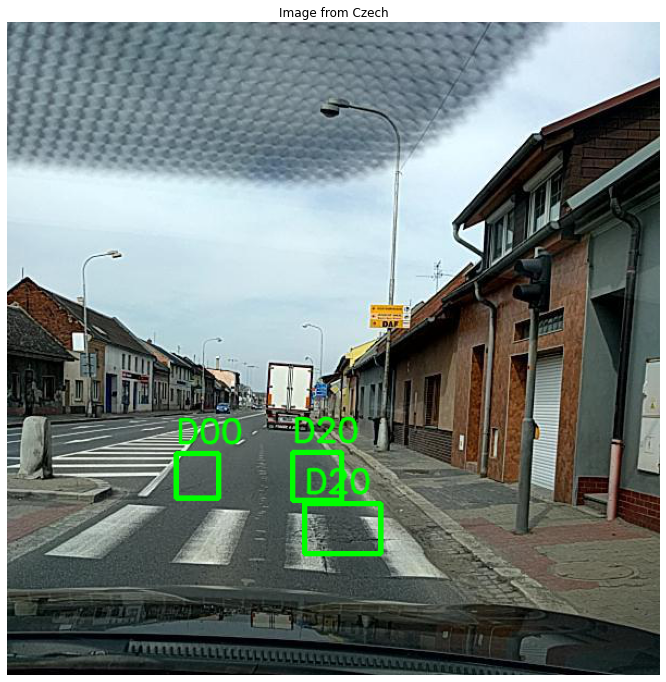

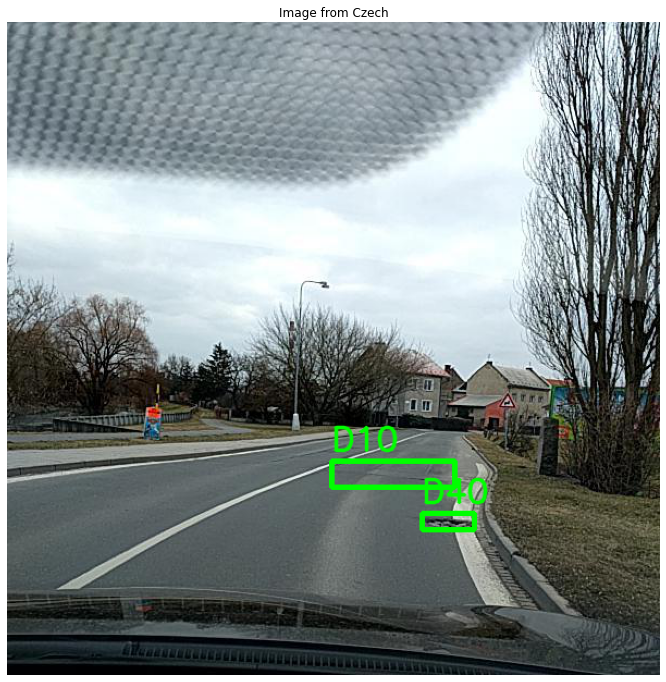

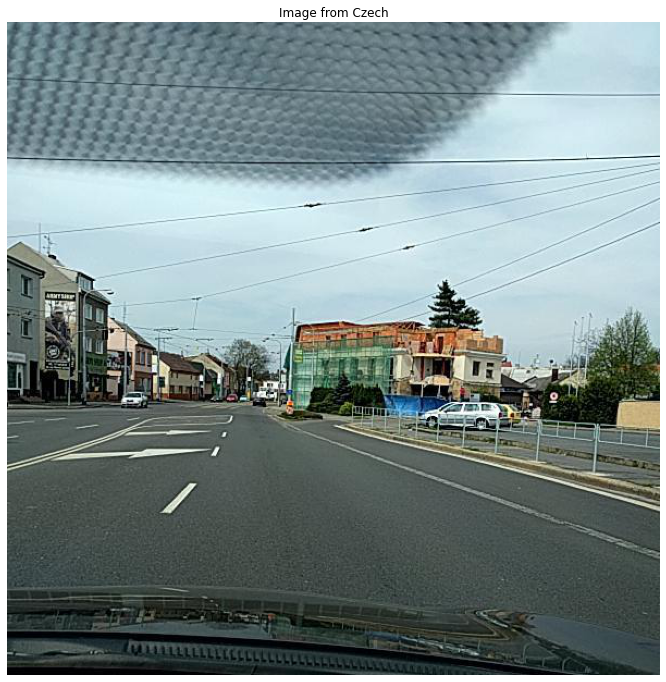

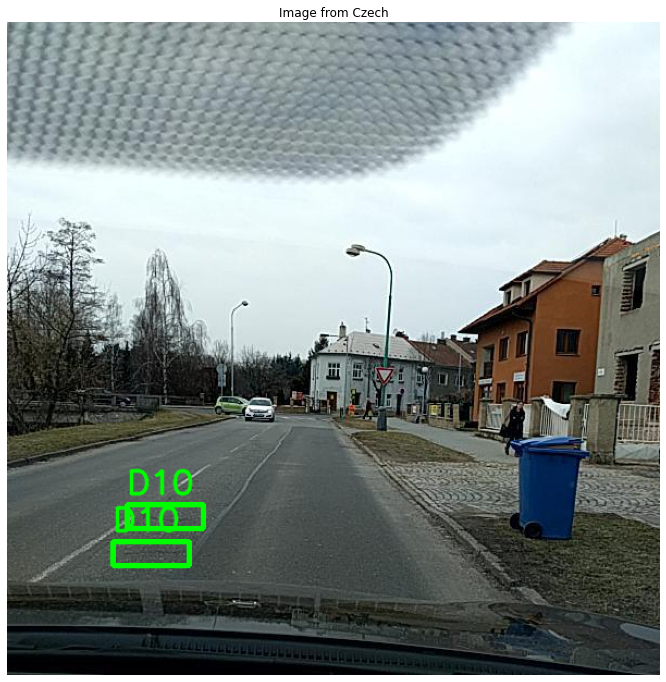

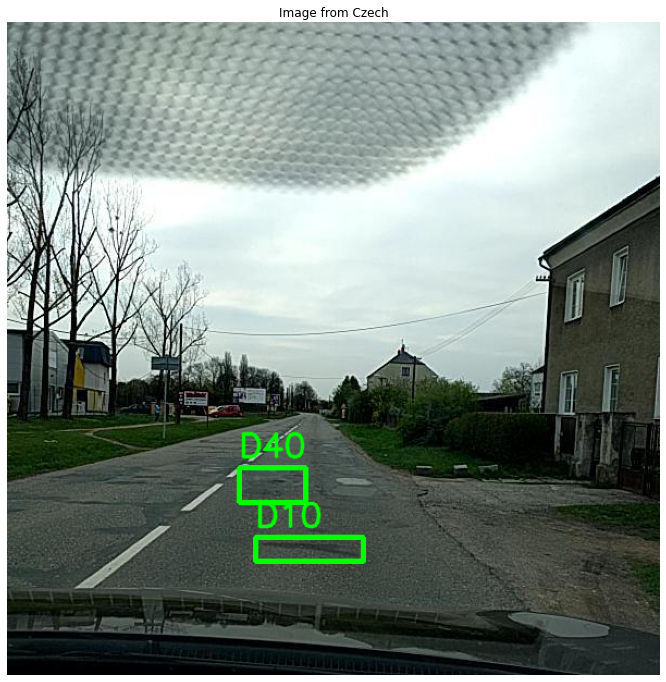

...

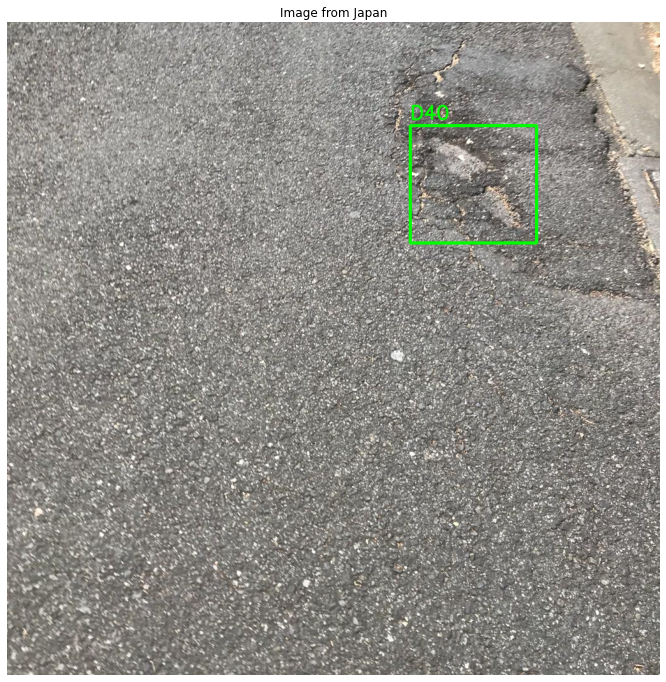

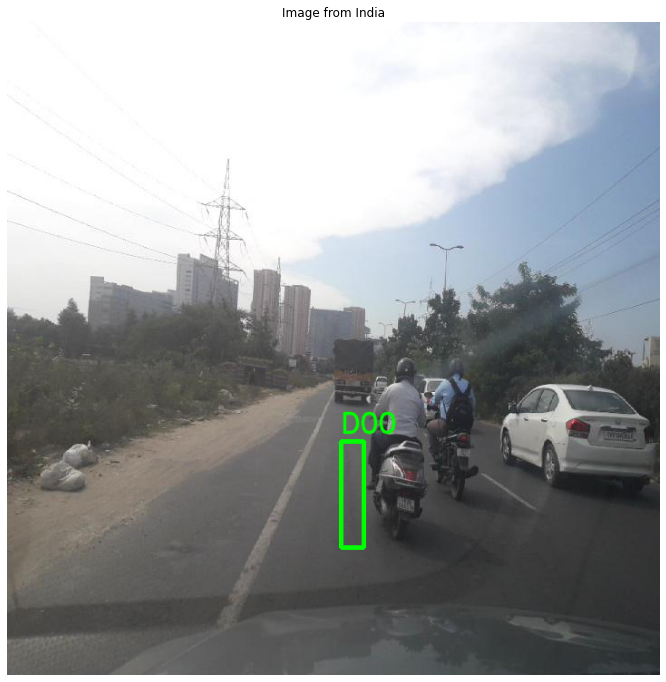

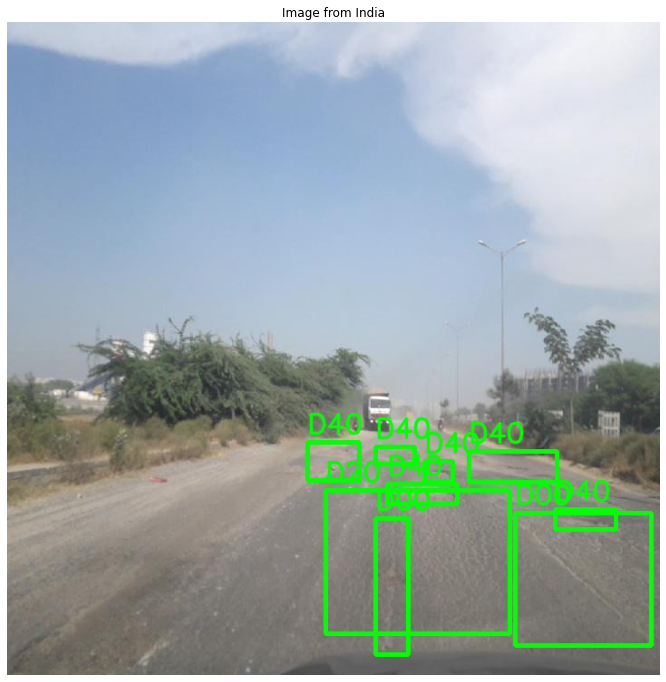

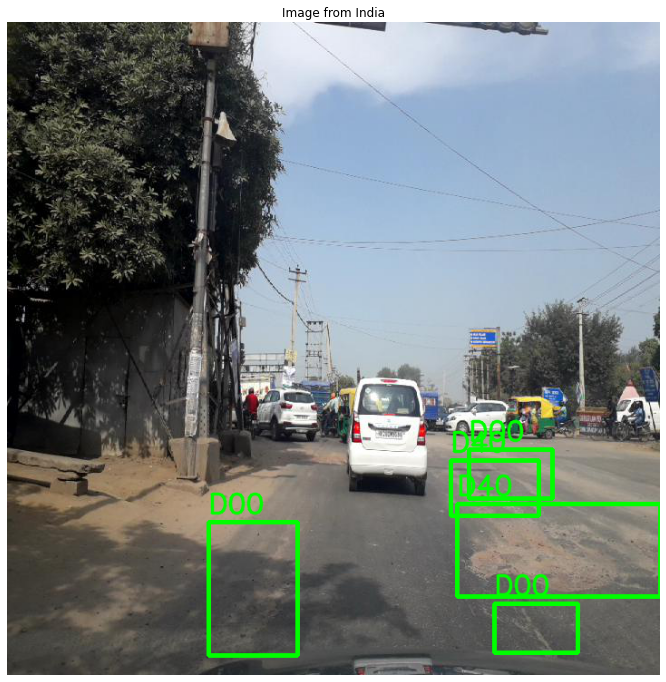

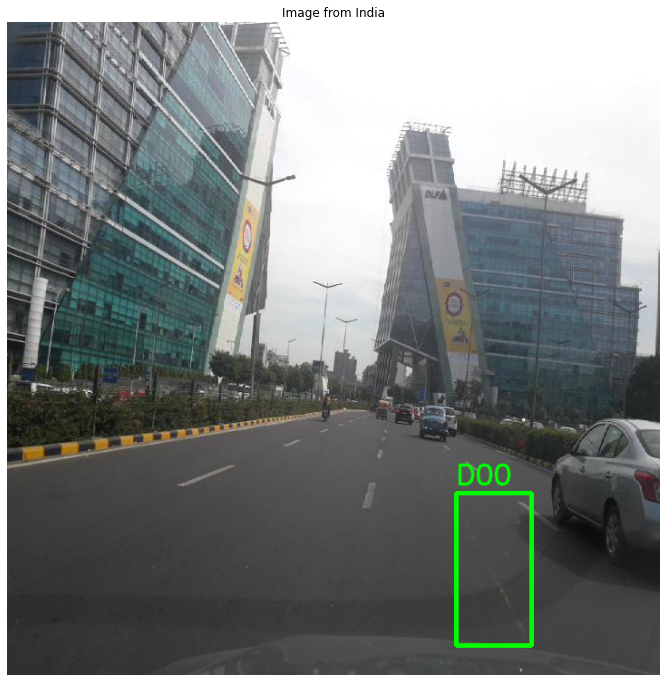

In [24]:
for cntry in cntry_list:
    file = open(base_path +"/"+ cntry + "/" + 'trainval.txt' , 'r')
    for image in file:
        image = image.rstrip('\n')
        img = draw_images(image)
        fig = plt.figure(figsize=(12,12))
        plt.axis('off')
        plt.title('Image ' + "from " + cntry)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()


In [9]:
#Change the working directory
%cd C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\MSc\Road_Damage_Detection\Data\Orig_Data\rdd_voc

C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\MSc\Road_Damage_Detection\Data\Orig_Data\rdd_voc


# Import the Images

In [10]:
base_path = r"C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\MSc\Road_Damage_Detection\Data\Orig_Data\rdd_voc"

# Damage Types
damageTypes=["D00","D10","D20", "D40"]

# Country List
cntry_list = ["Czech","Japan","India"] 

In [11]:
# the number of total images and total labels.
cls_names = []
total_images = 0
for cntry in cntry_list:
    
    file_list = [filename for filename in os.listdir(base_path + "/" + cntry + '\Annotations') if not filename.startswith('.')]

    for file in file_list:
        
        if file =='.DS_Store':
            pass
        else:
            path = base_path + "/" + cntry + '\Annotations' +  "/" + file
            xml_li = os.listdir(path)
            
            for infile_xml in xml_li:
                
                total_images = total_images + 1
                tree = ElementTree.parse(path+"/"+infile_xml)
                root = tree.getroot()
                for obj in root.iter('object'):
                    cls_name = obj.find('name').text
                    cls_names.append(cls_name)
                    
print("total")
print("Total Number of images：" + str(total_images))
print("Total Number of labels：" + str(len(cls_names)))

total
Total Number of images：12195
Total Number of labels：25046


D00 : 6592
D10 : 4446
D20 : 8381
D40 : 5627


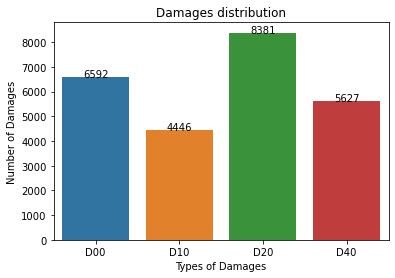

In [12]:
# Count the number of class labels
import collections

count_dict = collections.Counter(cls_names)
cls_count = []

for damageType in damageTypes:
    print(str(damageType) + ' : ' + str(count_dict[damageType]))
    cls_count.append(count_dict[damageType])

ax = sns.barplot(damageTypes, cls_count)
plt.ylabel("Number of Damages")
plt.xlabel("Types of Damages")
plt.title("Damages distribution")
for p in ax.patches:
    _x = p.get_x() + p.get_width() / 2
    _y = p.get_y() + p.get_height()
    value = int(p.get_height())
    ax.text(_x, _y, value, ha="center")
plt.show()

In [13]:
# create a data frame to store the images and class types 
i_df = pd.DataFrame(columns=cntry_list,index=damageTypes)
img_li = []
# the number of each class labels for each country
for cntry in cntry_list:
    cls_names = []
    total_images = 0
    file_list = [filename for filename in os.listdir(base_path + "/" + cntry + '\Annotations') if not filename.startswith('.')]

    for file in file_list:
        if file =='.DS_Store':
            pass
        else:
            path = base_path + "/" + cntry + '\Annotations' +  "/" + file
            xml_li = os.listdir(path)
            
            for infile_xml in xml_li:
                
                total_images = total_images + 1
                tree = ElementTree.parse(path+"/"+infile_xml)
                root = tree.getroot()
                for obj in root.iter('object'):
                    cls_name = obj.find('name').text
                    cls_names.append(cls_name)
    print(cntry)
    print("# of images：" + str(total_images))
    print("# of labels：" + str(len(cls_names)))
    img_li.append(total_images)
    
    count_dict = collections.Counter(cls_names)
    cls_count = []
    
    for damageType in damageTypes:
        #print(str(damageType) + ' : ' + str(count_dict[damageType]))
        cls_count.append(count_dict[damageType])
        
    i_df[cntry] = cls_count
    print('**************************************************')
    

Czech
# of images：1072
# of labels：1745
**************************************************
Japan
# of images：7900
# of labels：16470
**************************************************
India
# of images：3223
# of labels：6831
**************************************************


In [14]:
images_df = pd.concat([i_df,pd.DataFrame([img_li],columns=cntry_list,index=["Images"])])

In [15]:
images_df

,Czech,Japan,India
D00,988,4049,1555
D10,399,3979,68
D20,161,6199,2021
D40,197,2243,3187
Images,1072,7900,3223
